# EDA Germany 

In [191]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from datetime import date, time, datetime

In [192]:
#Create dataframe from CSV
df = pd.read_csv("../data/fromAPI/cleaned_hourly_all.csv")

In [193]:
df["train"].isna().sum()

0

In [194]:
date_format = "%Y-%m-%d %H:%M:%S"
df["arrival_plan"] = pd.to_datetime(df["arrival_plan"], format=date_format)
df["departure_plan"] = pd.to_datetime(df["departure_plan"], format=date_format)
df["arrival_change"] = pd.to_datetime(df["arrival_change"], format=date_format)
df["departure_change"] = pd.to_datetime(df["departure_change"], format=date_format)

df["arrival_plan_time"] = df["arrival_plan"].dt.time
df["arrival_plan_date"] = df["arrival_plan"].dt.date

df["departure_plan_time"] = df["departure_plan"].dt.time
df["departure_plan_date"] = df["departure_plan"].dt.date

In [195]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1210176 entries, 0 to 1210175
Data columns (total 23 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   ID                     1210176 non-null  object        
 1   train                  1210176 non-null  object        
 2   path                   1085029 non-null  object        
 3   eva_nr                 1210176 non-null  int64         
 4   category               1210176 non-null  int64         
 5   name                   1210176 non-null  object        
 6   state                  1210176 non-null  object        
 7   city                   1210176 non-null  object        
 8   zip                    1210176 non-null  int64         
 9   long                   1210176 non-null  float64       
 10  lat                    1210176 non-null  float64       
 11  arrival_plan           1085029 non-null  datetime64[ns]
 12  departure_plan         12101

In [196]:
df.describe()

,eva_nr,category,zip,long,lat,arrival_plan,departure_plan,arrival_change,departure_change,arrival_delay_m,departure_delay_m
count,1.210176e+06,1.210176e+06,1.210176e+06,1.210176e+06,1.210176e+06,1085029,1210176,929839,1010787,1.210176e+06,1.210176e+06
mean,8.018357e+06,3.873841e+00,4.630359e+04,1.017747e+01,5.087802e+01,2024-06-25 16:23:13.731558656,2024-06-25 16:23:31.055152384,2024-06-25 16:13:16.966937856,2024-06-25 16:14:45.357033216,1.363323e+00,1.417914e+00
min,8.000001e+06,1.000000e+00,1.067000e+03,6.070715e+00,4.741103e+01,2024-06-23 12:46:00,2024-06-23 13:00:00,2024-06-23 12:46:00,2024-06-23 13:00:00,0.000000e+00,0.000000e+00
25%,8.001583e+06,3.000000e+00,1.810900e+04,8.494709e+00,4.934848e+01,2024-06-24 14:02:00,2024-06-24 14:02:00,2024-06-24 13:56:00,2024-06-24 13:58:00,0.000000e+00,0.000000e+00
50%,8.004136e+06,4.000000e+00,4.705500e+04,9.930920e+00,5.106618e+01,2024-06-25 16:52:00,2024-06-25 16:51:00,2024-06-25 16:44:00,2024-06-25 16:44:00,0.000000e+00,0.000000e+00
75%,8.010209e+06,5.000000e+00,7.077100e+04,1.209055e+01,5.247854e+01,2024-06-26 16:30:00,2024-06-26 16:30:00,2024-06-26 16:14:00,2024-06-26 16:14:00,1.000000e+00,1.000000e+00
max,8.098360e+06,5.000000e+00,9.997400e+04,1.497908e+01,5.490684e+01,2024-06-27 15:59:00,2024-06-27 16:29:00,2024-06-27 17:03:00,2024-06-27 17:04:00,3.920000e+02,3.960000e+02
std,3.186486e+04,1.033983e+00,2.816790e+04,2.274344e+00,1.789765e+00,NaN,NaN,NaN,NaN,4.062730e+00,4.119411e+00


In [197]:
df.head()

,ID,train,path,eva_nr,category,name,state,city,zip,long,...,arrival_change,departure_change,arrival_delay_m,departure_delay_m,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,4083473720689476753-2406231250-4,20,Stolberg(Rheinl)Hbf|Eilendorf|Aachen-Rothe Erde,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-06-23 13:03:00,2024-06-23 13:04:00,2,2,on_time,on_time,13:01:00,2024-06-23,13:02:00,2024-06-23
1,-8892239479013746475-2406231212-14,20,Stolberg(Rheinl)Hbf Gl.44|Eschweiler-St.Jöris|...,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,2024-06-23 13:05:00,2024-06-23 13:06:00,5,5,on_time,on_time,13:00:00,2024-06-23,13:01:00,2024-06-23
2,3772983581833112391-2406231337-1,33,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,NaT,NaT,0,0,on_time,on_time,NaT,NaT,13:37:00,2024-06-23
3,-7760689325071259199-2406231337-1,29,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,NaT,NaT,0,0,on_time,on_time,NaT,NaT,13:37:00,2024-06-23
4,3762663024269879642-2406231318-1,9,NaN,8000001,2,Aachen Hbf,Nordrhein-Westfalen,Aachen,52064,6.091499,...,NaT,2024-06-23 13:18:00,0,0,on_time,on_time,NaT,NaT,13:18:00,2024-06-23


In [233]:
df.train.unique()

array(['20', '33', '29', '9', '4', '1', 'RE18', '13', '50', '89', 'RS5',
       '2', '7', 'RB24', 'RS1', '51', '6', '69', '3', 'RE80', 'RB81',
       '81', '80', '25', 'RB13', '10', '14', 'RB66', '23', '8', 'RE2',
       'S6', 'RB45', '34', 'RE34', 'RB91', 'RB85', '11', '5', 'RB84',
       '72', '5X', '45', '87', '31', '35', '40', '26', '38', '15', '61',
       '28', '55', '90', '42', 'RB25', 'RB20', '17', '57', 'RE1', 'RB61',
       'RB60', '46', '44', 'RB58', '88', 'RB75', 'RE83', '24', 'RE4',
       '41', 'RB31', 'RB54', 'RB10', '12', 'RB90', '27', 'RB67', '16',
       'RB77', '71', 'RB69', '73', '91', '53', '54', 'RE85', 'RB86', '19',
       'RB56', 'RE3', '22', 'RE5', '18', '10b', '10a', '82', 'RB42',
       'RE10', 'RB15', '65', '52', '113', 'RB40', 'RB41', 'RB49', '30',
       '39', 'RE60', 'RE70', '78', 'RB82', 'S4', 'S3', 'U28', '85',
       'RB11', 'RS3', '56', 'RB26', 'EV', 'RS2', '47', 'RB34', '32',
       'RB97', '68', '63', '67', '60', '21', 'S1', 'S25', '37', 'RB50',
   

# Temporal analysis

to be done: erste und letzte zeile rauswerfen, fehlende daten mit averages füllen, direkt vorgroupieren

In [198]:
df_temp_arr = df.dropna(subset=["arrival_plan"])
df_temp_dep = df.dropna(subset=["departure_plan"])

In [199]:
date_format = "%Y-%m-%d %H:%M:%S"
df_temp_arr = df.dropna(subset=["arrival_plan"]).copy()
df_temp_arr.loc[:, "arrival_plan_hour"] = df_temp_arr["arrival_plan"].dt.hour
df_temp_arr.loc[:, "arrival_plan_datetime"] = (
    df_temp_arr["arrival_plan_date"].astype(str) + ' ' +
    df_temp_arr["arrival_plan_hour"].astype(str) + ':00:00'
)
df_temp_arr.loc[:, "arrival_plan_datetime"] = pd.to_datetime(df_temp_arr["arrival_plan_datetime"], format=date_format)

In [217]:
df_temp_dep = df.dropna(subset=["departure_plan"]).copy()
df_temp_dep.loc[:, "departure_plan_hour"] = df_temp_dep["departure_plan"].dt.hour
df_temp_dep.loc[:, "departure_plan_datetime"] = (
    df_temp_dep["departure_plan_date"].astype(str) + ' ' +
    df_temp_dep["departure_plan_hour"].astype(str) + ':00:00'
)
df_temp_dep.loc[:, "departure_plan_datetime"] = pd.to_datetime(df_temp_dep["departure_plan_datetime"], format=date_format)

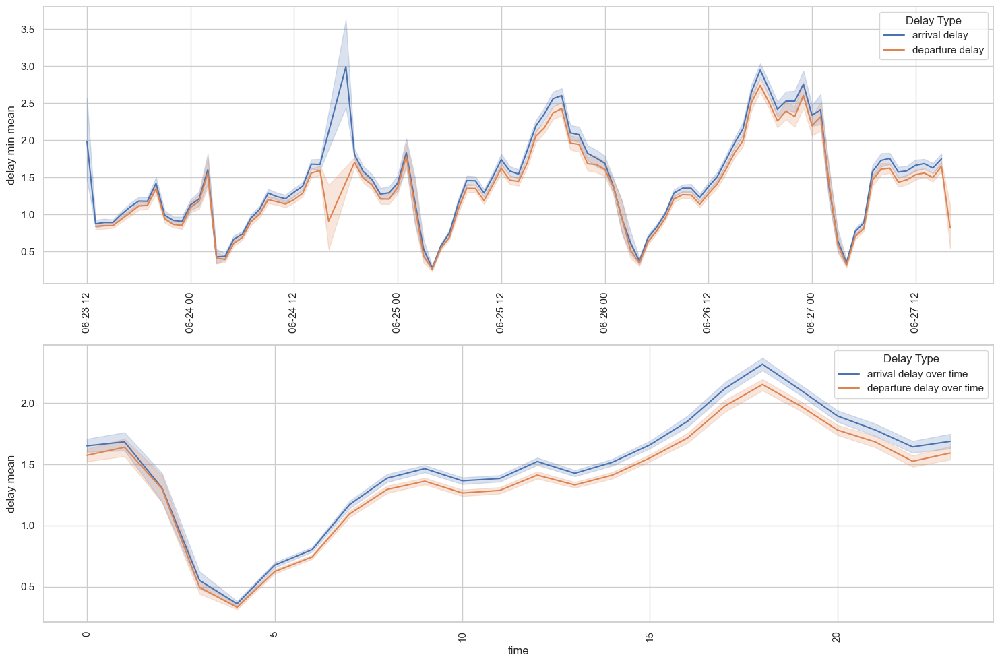

In [201]:
fig, axes = plt.subplots(nrows=2, figsize=(15, 10))

# First plot: arrival and departure delays over datetime
sns.lineplot(df_temp_arr, x="arrival_plan_datetime", y="arrival_delay_m", label="arrival delay", ax=axes[0])
sns.lineplot(df_temp_dep, x="departure_plan_datetime", y="departure_delay_m", label="departure delay", ax=axes[0])
axes[0].set_xlabel("")
axes[0].set_ylabel("delay min mean")
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title="Delay Type")

# Second plot: arrival and departure delays over time of day
sns.lineplot(df_temp_arr, x="arrival_plan_hour", y="arrival_delay_m", label="arrival delay over time", ax=axes[1])
sns.lineplot(df_temp_dep, x="departure_plan_hour", y="departure_delay_m", label="departure delay over time", ax=axes[1])
axes[1].set_xlabel("time")
axes[1].set_ylabel("delay mean")
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title="Delay Type")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

the data indicates a seasonality with peaks around late afternoon around 16:00.<br>
the gap on the 24th comes from a gap in the data collection around that time

as arrival and departure follow a similar temporal pattern, we will only discuss departure going further, as most departure delays also inherit arrival delays, but they can also be the source.

In [218]:
df_temp_cat = df_temp_dep.groupby(["departure_plan_datetime", "category"], as_index=False).departure_delay_m.mean()
df_temp_cat2 = df_temp_dep.groupby(["departure_plan_hour", "category"], as_index=False).departure_delay_m.mean()

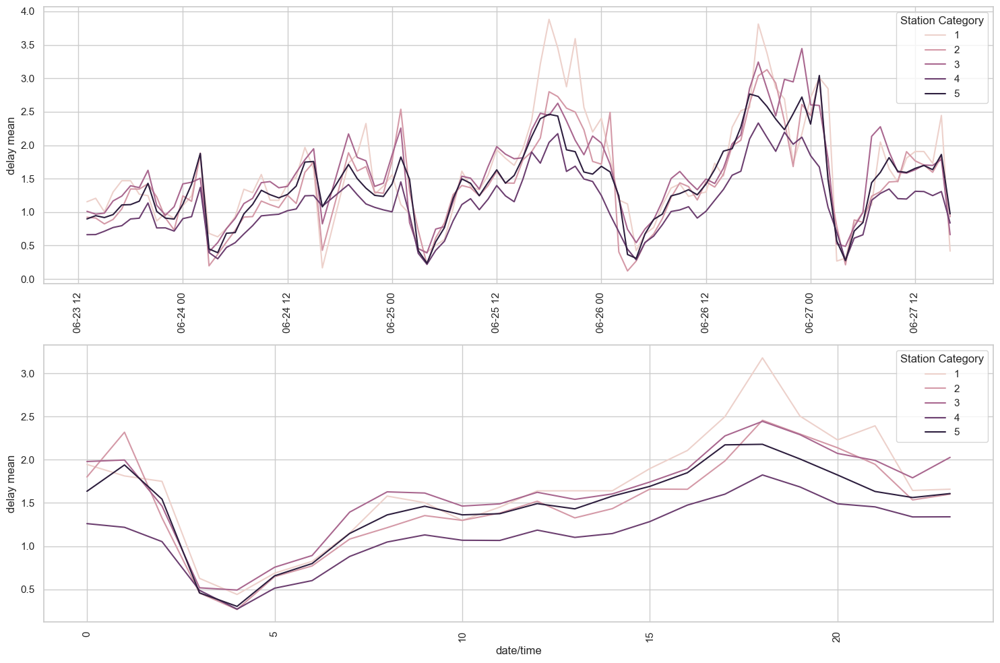

In [219]:
# Create a figure with two subplots arranged vertically
fig, axes = plt.subplots(nrows=2, figsize=(15, 10))

# First plot: arrival delays over datetime with category hue
sns.lineplot(df_temp_cat, x="departure_plan_datetime", y="departure_delay_m", hue="category", ax=axes[0])
axes[0].set_xlabel("")
axes[0].set_ylabel("delay mean")
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title="Station Category")

# Second plot: arrival delays over time of day with category hue
sns.lineplot(df_temp_cat2, x="departure_plan_hour", y="departure_delay_m", hue="category", ax=axes[1])
axes[1].set_xlabel("date/time")
axes[1].set_ylabel("delay mean")
axes[1].tick_params(axis='x', rotation=90)
axes[1].legend(title="Station Category")

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

In [223]:
df.state.unique()

array(['Nordrhein-Westfalen', 'Baden-Württemberg', 'Niedersachsen',
       'Schleswig-Holstein', 'Berlin', 'Bayern', 'Hessen', 'Hamburg',
       'Thüringen', 'Rheinland-Pfalz', 'Brandenburg',
       'Mecklenburg-Vorpommern', 'Sachsen', 'Sachsen-Anhalt', 'Saarland',
       'Bremen'], dtype=object)

In [234]:
statelist = df.state.unique()
frames = {}
for state in statelist:
    frames[state] = df[df["state"] == state]

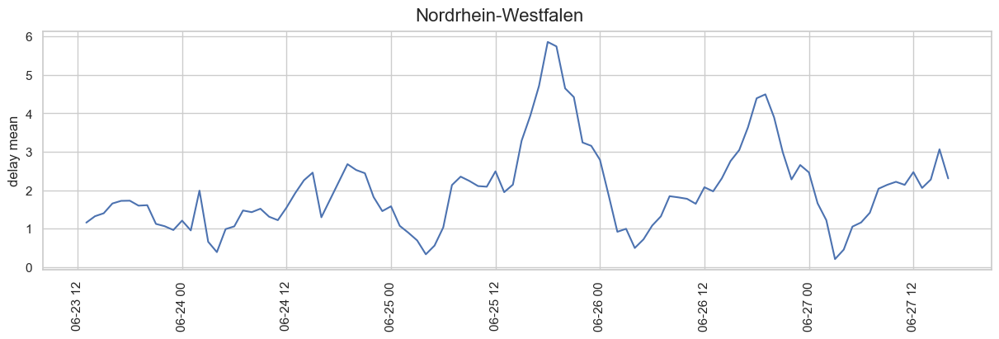

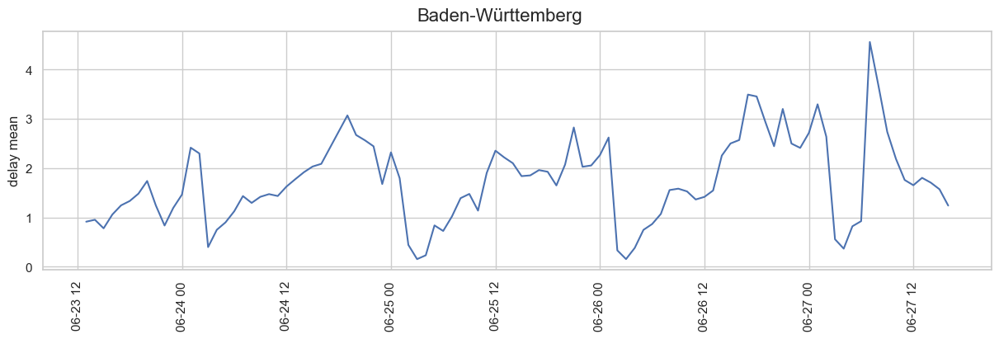

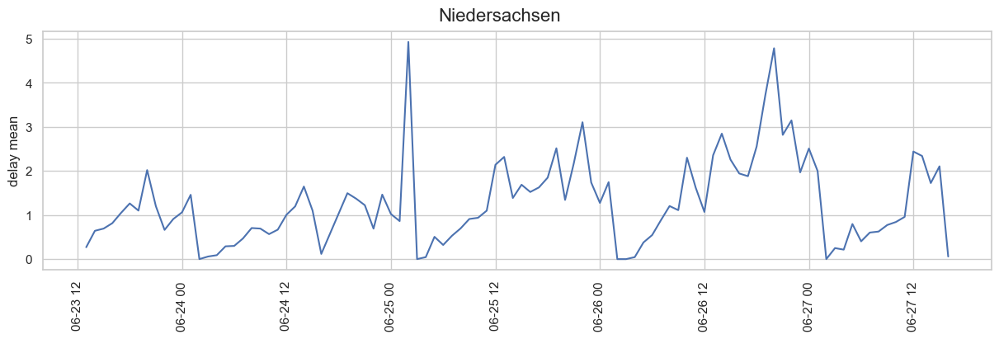

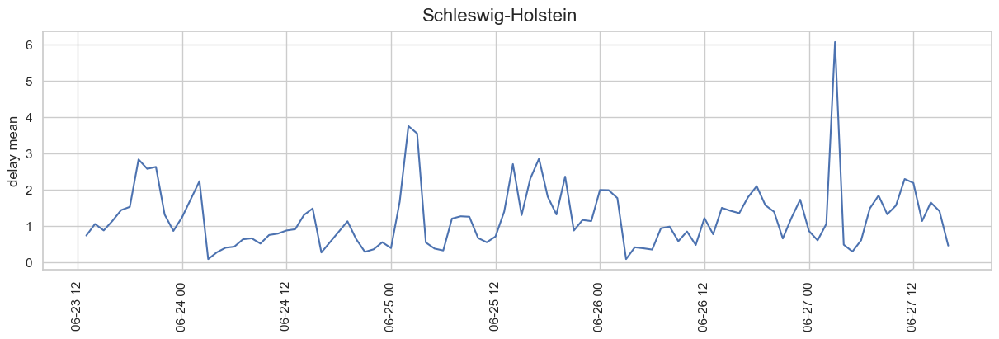

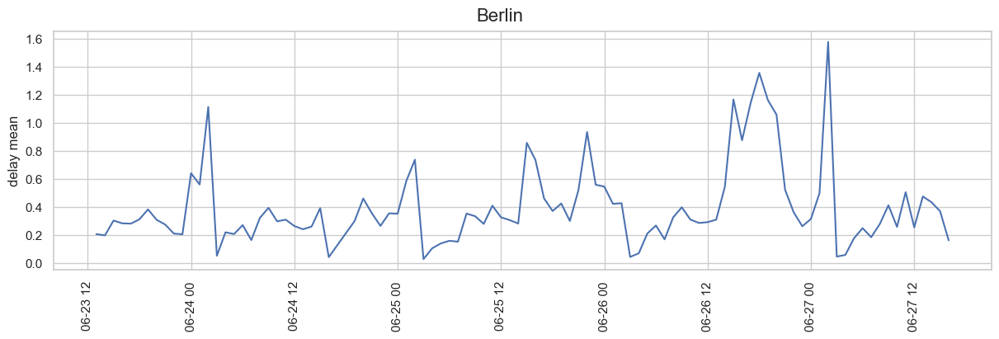

...

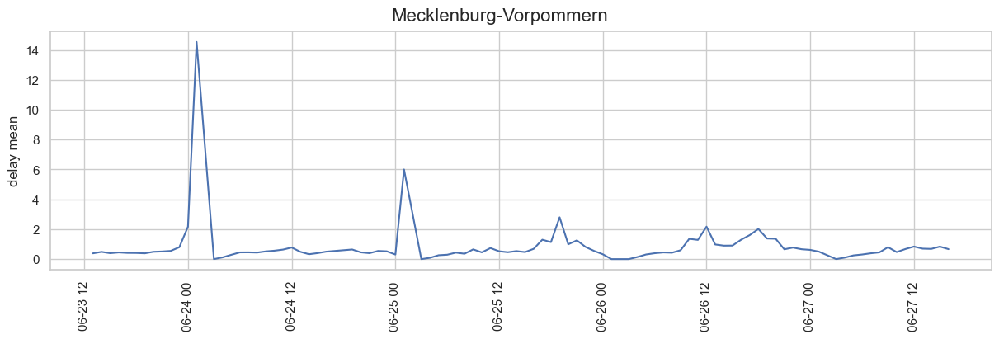

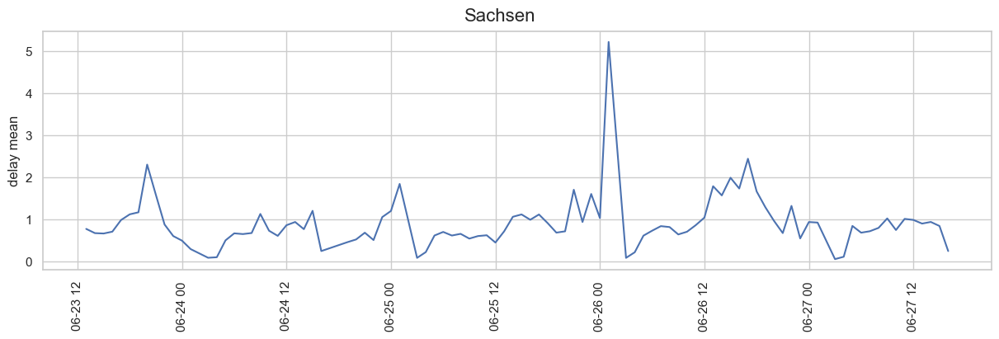

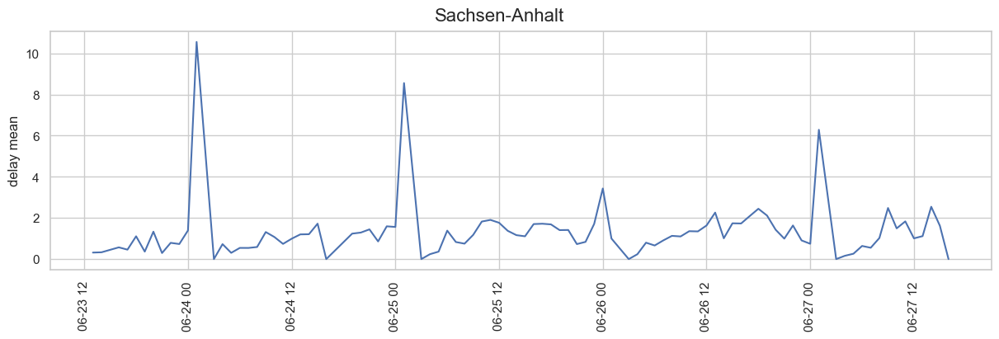

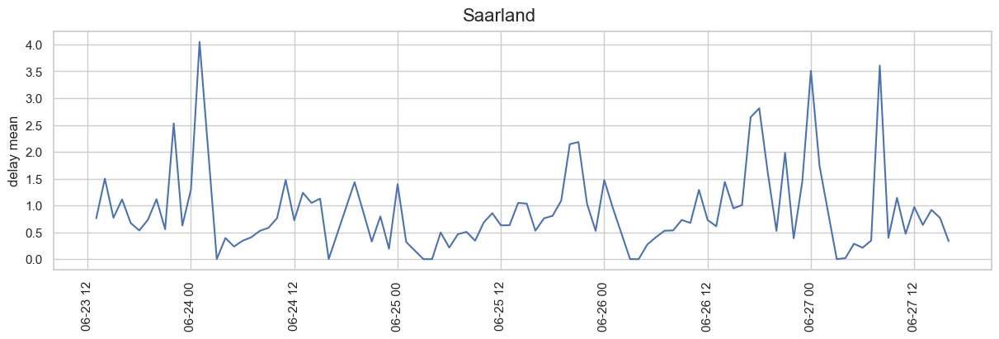

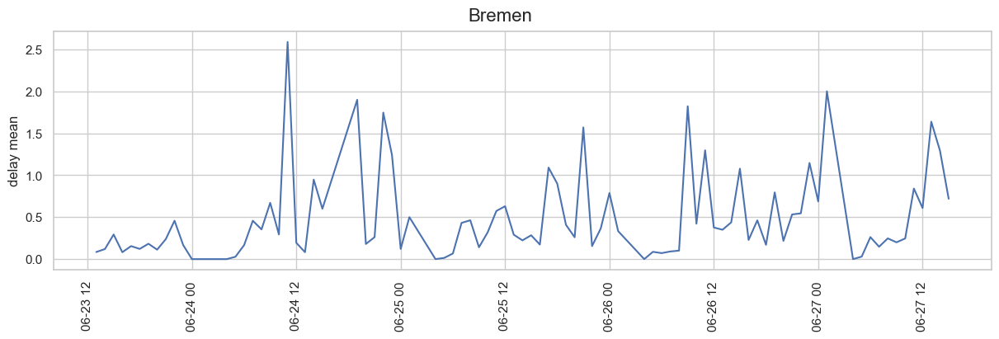

In [237]:
for state in statelist:
    fig, axes = plt.subplots(1, 1, figsize=(12, 4), constrained_layout=True)
    df_temp = frames[state]
    df_temp.set_index('departure_plan', inplace=True)
    numeric_cols = df_temp.select_dtypes(include=['float64', 'int64'])
    hourly_data = numeric_cols.resample('h').mean()

    sns.lineplot(hourly_data, x=hourly_data.index,  y="departure_delay_m", ax=axes)
    axes.set_xlabel("")
    axes.set_ylabel("delay mean")
    axes.tick_params(axis='x', rotation=90)
    #axes.legend(title="Station Category")


    fig.suptitle(state, fontsize=16)
    plt.show()


All station types follow a similar pattern,  while the mean of the delay increases the lower the category (more delay on main junctions)

In [204]:
heatmap_df2 = df_temp_dep.groupby(["name","departure_plan_datetime"], as_index=False ).mean(numeric_only=True)

In [145]:
fig = px.density_mapbox(heatmap_df2,
                        lat='lat', lon='long', z='arrival_delay_m',
                        hover_name='name',
                        radius=10,
                        center=dict(lat=0, lon=180), zoom=10,
                        range_color=[0, heatmap_df2.arrival_delay_m.max()],
                        animation_frame="arrival_plan_datetime"
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 51.1657, "lon": 10.4515},  # Centered on Germany
    mapbox_zoom=5,
    width=700,
    height=700
)

# Geographical analysis
## Heatmap

In [146]:
heatmap_df = df.groupby("name", as_index=False ).mean(numeric_only=True)

In [148]:
fig = px.density_mapbox(heatmap_df,
                        lat='lat', lon='long', z='departure_delay_m',
                        hover_name='name',
                        radius=10,
                        center=dict(lat=0, lon=180), zoom=10,
                        range_color=[0, heatmap_df.arrival_delay_m.max()]
)
fig.update_layout(
    mapbox_style="carto-positron",
    mapbox_center={"lat": 51.1657, "lon": 10.4515},  # Centered on Germany
    mapbox_zoom=5,
    width=700,
    height=800
)
fig.show()

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from mpl_toolkits.basemap import Basemap
# from scipy.ndimage.filters import gaussian_filter

# # Generate random geolocation data within Germany's lat/lon bounds
# num_points = 1000
# lats = np.random.uniform(47.27, 55.06, num_points)
# lons = np.random.uniform(5.87, 15.04, num_points)

# fig, ax = plt.subplots(figsize=(10, 10))

# m = Basemap(projection='merc',
#             llcrnrlat=47.27,
#             urcrnrlat=55.06,
#             llcrnrlon=5.87,
#             urcrnrlon=15.04,
#             resolution='i', ax=ax)

# m.drawcountries()
# m.drawcoastlines()
# m.drawmapboundary(fill_color='aqua')
# m.fillcontinents(color='coral', lake_color='aqua')

# # Transform the coordinates to map projection
# x, y = m(lons, lats)

# # Create a 2D histogram of the data
# heatmap, xedges, yedges = np.histogram2d(x, y, bins=100)

# # Apply Gaussian filter to smooth the heatmap
# heatmap = gaussian_filter(heatmap, sigma=15)

# # Plot the heatmap
# extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
# ax.imshow(heatmap.T, extent=extent, origin='lower', cmap='hot', alpha=0.6)

# plt.title('Geolocation Heatmap Centered on Germany')
# plt.show()

# Creating columns for arrival and departure analysis

In [149]:
df_state_count_delay = df[df["arrival_delay_check"] == "delay"].groupby("state", as_index=False).count()
df_state_count_delay.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,arrival_change,departure_change,arrival_delay_m,departure_delay_m,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,12845,12845,12845,12845,12845,12845,12845,12845,12845,...,12845,12812,12845,12845,12845,12845,12845,12845,12845,12845
1,Bayern,13662,13662,13662,13662,13662,13662,13662,13662,13662,...,13662,13647,13662,13662,13662,13662,13662,13662,13662,13662
2,Berlin,2944,2944,2944,2944,2944,2944,2944,2944,2944,...,2944,2938,2944,2944,2944,2944,2944,2944,2944,2944
3,Brandenburg,1139,1139,1139,1139,1139,1139,1139,1139,1139,...,1139,1138,1139,1139,1139,1139,1139,1139,1139,1139
4,Bremen,147,147,147,147,147,147,147,147,147,...,147,147,147,147,147,147,147,147,147,147


In [150]:
df_state_count_delay2 = df[df["departure_delay_check"] == "delay"].groupby("state", as_index=False).count()
df_state_count_delay.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,arrival_change,departure_change,arrival_delay_m,departure_delay_m,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,12845,12845,12845,12845,12845,12845,12845,12845,12845,...,12845,12812,12845,12845,12845,12845,12845,12845,12845,12845
1,Bayern,13662,13662,13662,13662,13662,13662,13662,13662,13662,...,13662,13647,13662,13662,13662,13662,13662,13662,13662,13662
2,Berlin,2944,2944,2944,2944,2944,2944,2944,2944,2944,...,2944,2938,2944,2944,2944,2944,2944,2944,2944,2944
3,Brandenburg,1139,1139,1139,1139,1139,1139,1139,1139,1139,...,1139,1138,1139,1139,1139,1139,1139,1139,1139,1139
4,Bremen,147,147,147,147,147,147,147,147,147,...,147,147,147,147,147,147,147,147,147,147


In [151]:
df_state_count = df.groupby("state", as_index=False).count()
df_state_count.head()

,state,ID,train,path,eva_nr,category,name,city,zip,long,...,arrival_change,departure_change,arrival_delay_m,departure_delay_m,arrival_delay_check,departure_delay_check,arrival_plan_time,arrival_plan_date,departure_plan_time,departure_plan_date
0,Baden-Württemberg,153345,153345,134058,153345,153345,153345,153345,153345,153345,...,121927,135830,153345,153345,153345,153345,134058,134058,153345,153345
1,Bayern,191009,191009,171876,191009,191009,191009,191009,191009,191009,...,161276,175345,191009,191009,191009,191009,171876,171876,191009,191009
2,Berlin,197424,197424,190326,197424,197424,197424,197424,197424,197424,...,148070,148021,197424,197424,197424,197424,190326,190326,197424,197424
3,Brandenburg,34283,34283,28108,34283,34283,34283,34283,34283,34283,...,24098,26895,34283,34283,34283,34283,28108,28108,34283,34283
4,Bremen,6123,6123,4872,6123,6123,6123,6123,6123,6123,...,1898,2802,6123,6123,6123,6123,4872,4872,6123,6123


In [152]:
df_state_sum = df.groupby("state", as_index=False).sum("arrival_delay_m")
df_state_sum.head()


,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m
0,Baden-Württemberg,1227253967592,581551,11322875767,1.372832e+06,7.474085e+06,260803,279989
1,Bayern,1528683476058,727114,16273705242,2.169454e+06,9.265278e+06,332462,338971
2,Berlin,1595825232386,778979,2345782364,2.644583e+06,1.036573e+07,79026,79332
3,Brandenburg,275490967347,141992,476458952,4.605306e+05,1.796195e+06,26040,29052
4,Bremen,48989269648,24729,173521847,5.349559e+04,3.255924e+05,2860,2988


## Merging Dataframes

In [153]:
#merging
df_state = pd.merge(df_state_sum, df_state_count[["state","arrival_plan","departure_plan"]], how='left', on="state", suffixes=('', '_count'))
df_state = pd.merge(df_state, df_state_count_delay[["state","arrival_delay_check"]], how='left', on="state", suffixes=('', '_count'))
df_state = pd.merge(df_state, df_state_count_delay2[["state","departure_delay_check"]], how='left', on="state", suffixes=('', '_count'))

In [154]:
df_state = df_state[[
    'state', 
    #'eva_nr', 'category', 'zip', 'long', 'lat', 
    'arrival_delay_m',
    'departure_delay_m', 'arrival_plan', 'departure_plan',
    'arrival_delay_check', 'departure_delay_check',
    ]]

In [155]:
df_state.head()

,state,arrival_delay_m,departure_delay_m,arrival_plan,departure_plan,arrival_delay_check,departure_delay_check
0,Baden-Württemberg,260803,279989,134058,153345,12845,13442
1,Bayern,332462,338971,171876,191009,13662,13268
2,Berlin,79026,79332,190326,197424,2944,2887
3,Brandenburg,26040,29052,28108,34283,1139,1192
4,Bremen,2860,2988,4872,6123,147,128


## Calculating new rows

In [156]:
df_state["arrival_plan%"] = (df_state["arrival_plan"] / df_state["arrival_plan"].sum()) * 100
df_state["arr_delay_amount_%"] = (df_state["arrival_delay_m"] / df_state["arrival_delay_m"].sum()) * 100
df_state["delay/arrival"] = (df_state["arrival_delay_m"] / df_state["arrival_plan"])
df_state["delay_cnt/arrival"] = (df_state["arrival_delay_check"] / df_state["arrival_plan"]) *100

In [157]:
df_state["departure_plan%"] = (df_state["departure_plan"] / df_state["departure_plan"].sum()) * 100
df_state["dep_delay_amount_%"] = (df_state["departure_delay_m"] / df_state["departure_delay_m"].sum()) * 100
df_state["delay/departure"] = (df_state["departure_delay_m"] / df_state["departure_plan"])
df_state["delay_cnt/departure"] = (df_state["departure_delay_check"] / df_state["departure_plan"]) *100

In [158]:
df_state.head()

,state,arrival_delay_m,departure_delay_m,arrival_plan,departure_plan,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
0,Baden-Württemberg,260803,279989,134058,153345,12845,13442,12.355246,15.807574,1.945449,9.581674,12.671297,16.317088,1.825876,8.765855
1,Bayern,332462,338971,171876,191009,13662,13268,15.840683,20.150910,1.934313,7.948754,15.783572,19.754418,1.774634,6.946270
2,Berlin,79026,79332,190326,197424,2944,2887,17.541098,4.789858,0.415214,1.546820,16.313660,4.623279,0.401836,1.462335
3,Brandenburg,26040,29052,28108,34283,1139,1192,2.590530,1.578315,0.926427,4.052227,2.832894,1.693081,0.847417,3.476942
4,Bremen,2860,2988,4872,6123,147,128,0.449020,0.173348,0.587028,3.017241,0.505959,0.174133,0.487996,2.090479


# Side by Side comparison

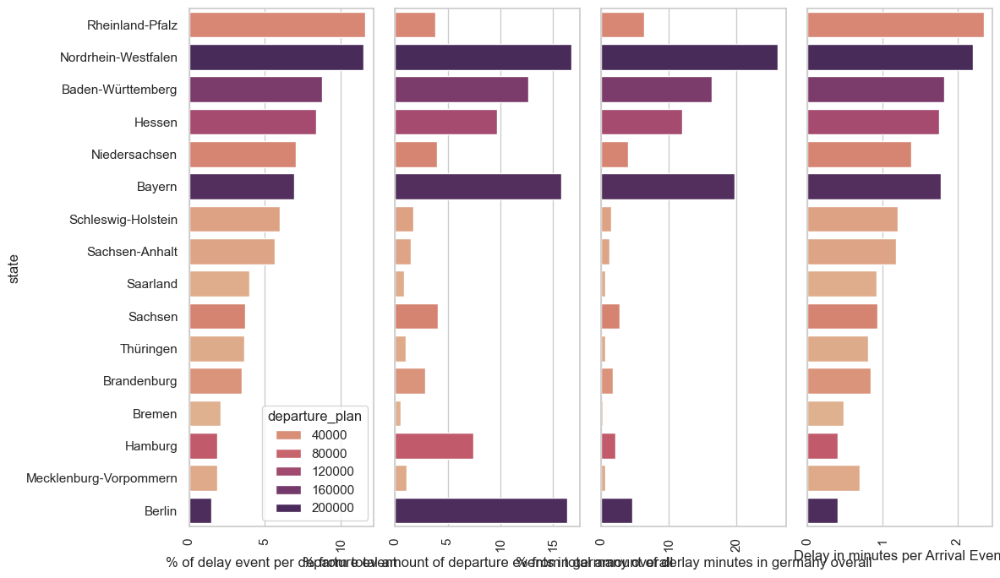

In [250]:
# Define the figure and the subplots
fig, axes = plt.subplots(1, 4, figsize=(12, 7))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_state.sort_values(by="delay_cnt/departure", ascending=False), y="state", x="delay_cnt/departure", 
            palette="flare", orient="h", hue="departure_plan", ax=axes[0])
axes[0].set_xlabel("% of delay event per departure event")
axes[0].tick_params(axis='x', rotation=90)
axes[0].legend(title="departure_plan")


sns.barplot(data=df_state.sort_values(by="delay_cnt/departure", ascending=False), x="departure_plan%", y="state", 
            palette="flare", hue="departure_plan", orient="h", ax=axes[1])
axes[1].set_xlabel("% from total amount of departure events in germany overall")
axes[1].set_ylabel("States")
axes[1].get_yaxis().set_visible(False)
axes[1].tick_params(axis='x', rotation=90)
axes[1].get_legend().remove()

# Second bar plot
sns.barplot(data=df_state.sort_values(by="delay_cnt/departure", ascending=False), x="dep_delay_amount_%", y="state", 
            palette="flare", hue="departure_plan", orient="h", ax=axes[2])
axes[2].set_xlabel("% from total amount of derlay minutes in germany overall")
axes[2].yaxis.set_ticklabels([])
axes[2].get_yaxis().set_visible(False)
axes[2].tick_params(axis='x', rotation=90)
axes[2].get_legend().remove()

# Third bar plot
sns.barplot(data=df_state.sort_values(by="delay_cnt/departure", ascending=False), y="state", x="delay/departure", 
            palette="flare", orient="h", hue="departure_plan", ax=axes[3])
axes[3].set_xlabel("Delay in minutes per Arrival Event")
axes[3].yaxis.set_ticklabels([])
axes[3].get_yaxis().set_visible(False)
axes[3].tick_params(axis='x', rotation=90)
axes[3].get_legend().remove()



# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

NRW; BW, Bayern and Hessen have the highest ratio of delay time to arrival events and are therefore the prime suspects for in depth analysis.
<br>While Rheinland-Pfalz and Niedersachsen also have a high ratio, they are contributing much less to the total amount of arrival events and therefore not as important to prioritize.

# Details for the most important States
### NRW, BW, Bayern, Hessen

In [161]:
df_city_sum = df.groupby(["city", "state"], as_index=False).sum("arrival_delay_m")
df_city_count = df.groupby(["city", "state"], as_index=False).count()
df_city_count_delay2 = df[df["departure_delay_check"] == "delay"].groupby(["city", "state"], as_index=False).count()
df_city_count_delay = df[df["arrival_delay_check"] == "delay"].groupby(["city", "state"], as_index=False).count()

df_city = pd.merge(df_city_sum, df_city_count[["city","arrival_plan","departure_plan"]], how='left', on="city", suffixes=('', '_count'))
df_city = pd.merge(df_city, df_city_count_delay[["city","arrival_delay_check"]], how='left', on="city", suffixes=('', '_count'))
df_city = pd.merge(df_city, df_city_count_delay2[["city","departure_delay_check"]], how='left', on="city", suffixes=('', '_count'))

df_city["arrival_plan%"] = (df_city["arrival_plan"] / df_city["arrival_plan"].sum()) * 100
df_city["arr_delay_amount_%"] = (df_city["arrival_delay_m"] / df_city["arrival_delay_m"].sum()) * 100
df_city["delay/arrival"] = (df_city["arrival_delay_m"] / df_city["arrival_plan"])
df_city["delay_cnt/arrival"] = (df_city["arrival_delay_check"] / df_city["arrival_plan"]) *100

df_city["departure_plan%"] = (df_city["departure_plan"] / df_city["departure_plan"].sum()) * 100
df_city["dep_delay_amount_%"] = (df_city["departure_delay_m"] / df_city["departure_delay_m"].sum()) * 100
df_city["delay/departure"] = (df_city["departure_delay_m"] / df_city["departure_plan"])
df_city["delay_cnt/departure"] = (df_city["departure_delay_check"] / df_city["departure_plan"]) *100

In [162]:
df_city

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
0,Dresden,Sachsen,1266129050,790,168586,2165.887858,8066.853372,179,175,158,...,6.0,5.0,0.014470,0.010774,1.132911,3.797468,0.012946,0.010118,1.107595,3.164557
1,Freinsheim,Rheinland-Pfalz,2960138380,1480,24882870,3035.921040,18315.552410,303,247,256,...,3.0,NaN,0.023445,0.018238,1.183594,1.171875,0.030318,0.014281,0.667568,NaN
2,Nürnberg,Bayern,3400845325,2125,38451875,4748.979750,21000.669500,369,533,425,...,5.0,4.0,0.038922,0.022211,0.868235,1.176471,0.034824,0.030816,1.254118,0.941176
3,Pforzheim,Baden-Württemberg,2528613672,1580,23757196,2763.031952,15455.511336,437,437,316,...,20.0,20.0,0.028939,0.026304,1.382911,6.329114,0.025893,0.025266,1.382911,6.329114
4,Remchingen,Baden-Württemberg,2305854720,1440,21656448,2468.855520,14098.712256,374,415,222,...,13.0,21.0,0.020331,0.022512,1.684685,5.855856,0.023599,0.023994,1.440972,7.291667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1302,Züssow,Mecklenburg-Vorpommern,1882443060,1175,4111325,3183.824885,12683.861565,262,271,159,...,13.0,12.0,0.014561,0.015770,1.647799,8.176101,0.019256,0.015668,1.153191,5.106383
1303,Öhringen,Baden-Württemberg,3626094219,2265,33799689,4304.725365,22289.055942,686,651,444,...,24.0,24.0,0.040662,0.041292,1.545045,5.405405,0.037119,0.037639,1.437086,5.298013
1304,Ötigheim,Baden-Württemberg,2417400072,1208,23093940,2488.655764,14764.334852,348,340,302,...,17.0,17.0,0.027657,0.020947,1.152318,5.629139,0.024746,0.019658,1.125828,5.629139
1305,Übach-Palenberg,Nordrhein-Westfalen,3602670750,2250,23638950,2743.769250,22915.951200,2443,2404,450,...,114.0,111.0,0.041211,0.147049,5.428889,25.333333,0.036873,0.138992,5.342222,24.666667


In [163]:
# Creating df_city for the single states
df_nrw = df_city[df_city["state"] == "Nordrhein-Westfalen"]
df_bw = df_city[df_city["state"] == "Baden-Württemberg"]
df_bay = df_city[df_city["state"] == "Bayern"]
df_hes = df_city[df_city["state"] == "Hessen"]

## 1) NRW

In [164]:
#NRW
df_nrw.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
6,Aachen,Nordrhein-Westfalen,24225956140,12040,157345900,18391.440508,153434.639704,5696,6173,2429,...,276.0,294.0,0.222449,0.342853,2.344998,11.362701,0.247622,0.356904,2.042687,9.728657
10,Ahaus,Nordrhein-Westfalen,1088059432,680,6620888,954.237608,7083.108616,237,212,136,...,14.0,13.0,0.012455,0.014265,1.742647,10.294118,0.011144,0.012257,1.558824,9.558824
11,Ahlen,Nordrhein-Westfalen,2384131418,1192,17649646,2352.855424,15424.796476,542,542,298,...,34.0,34.0,0.027291,0.032624,1.818792,11.409396,0.024418,0.031337,1.818792,11.409396
21,Altena,Nordrhein-Westfalen,2208141588,1104,16218312,2116.591008,14159.346756,868,883,276,...,43.0,48.0,0.025276,0.052247,3.144928,15.579710,0.022615,0.051052,3.199275,17.391304
22,Altenbeken,Nordrhein-Westfalen,5168002584,1938,21436864,5777.384074,33441.115718,686,568,642,...,26.0,23.0,0.058795,0.041292,1.068536,4.049844,0.052933,0.032840,0.879257,3.560372


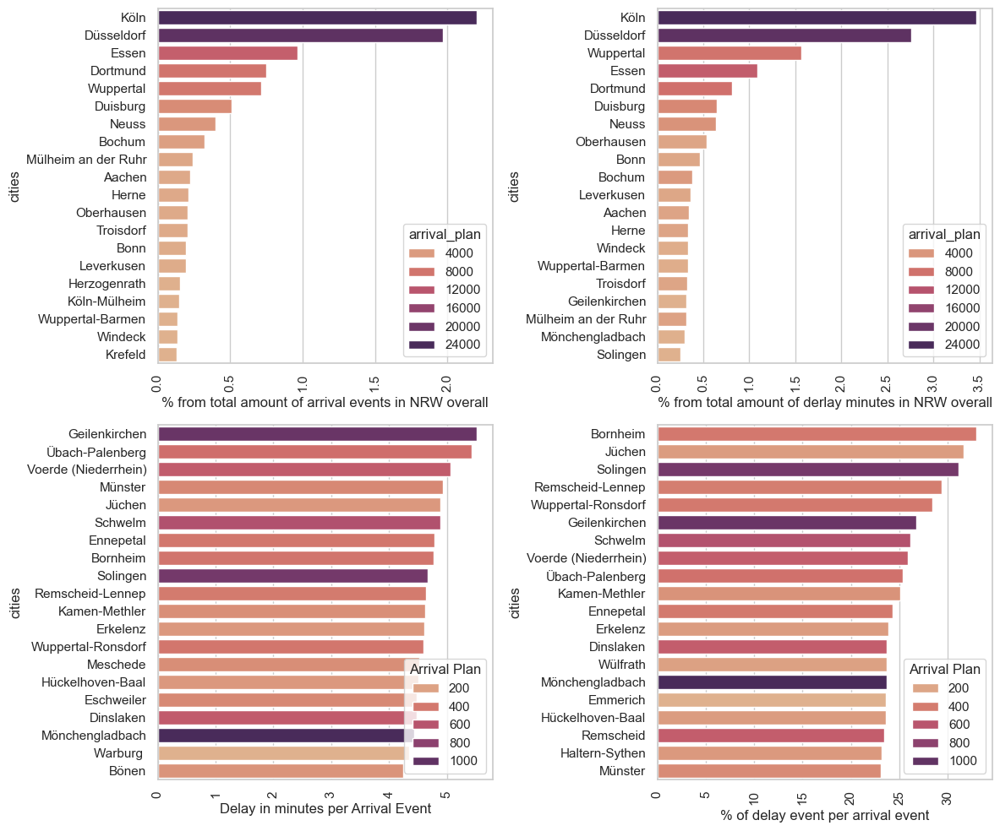

In [165]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_nrw.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in NRW overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_nrw.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in NRW overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_nrw.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_nrw.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 2) Baden-Württemberg

In [166]:
df_bw.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
3,Pforzheim,Baden-Württemberg,2528613672,1580,23757196,2763.031952,15455.511336,437,437,316,...,20.0,20.0,0.028939,0.026304,1.382911,6.329114,0.025893,0.025266,1.382911,6.329114
4,Remchingen,Baden-Württemberg,2305854720,1440,21656448,2468.855520,14098.712256,374,415,222,...,13.0,21.0,0.020331,0.022512,1.684685,5.855856,0.023599,0.023994,1.440972,7.291667
5,Stutensee,Baden-Württemberg,1928243169,1205,18387577,2039.999689,11825.033248,210,210,241,...,12.0,11.0,0.022071,0.012640,0.871369,4.979253,0.019747,0.012142,0.871369,4.564315
7,Aalen,Baden-Württemberg,3576000894,1341,32823210,4513.033137,21831.932811,403,333,159,...,30.0,22.0,0.014561,0.024257,2.534591,18.867925,0.036627,0.019253,0.744966,4.921700
8,Achern,Baden-Württemberg,2912149968,1456,28339220,2935.777936,17702.772360,222,248,232,...,7.0,8.0,0.021247,0.013363,0.956897,3.017241,0.029826,0.014339,0.681319,2.197802


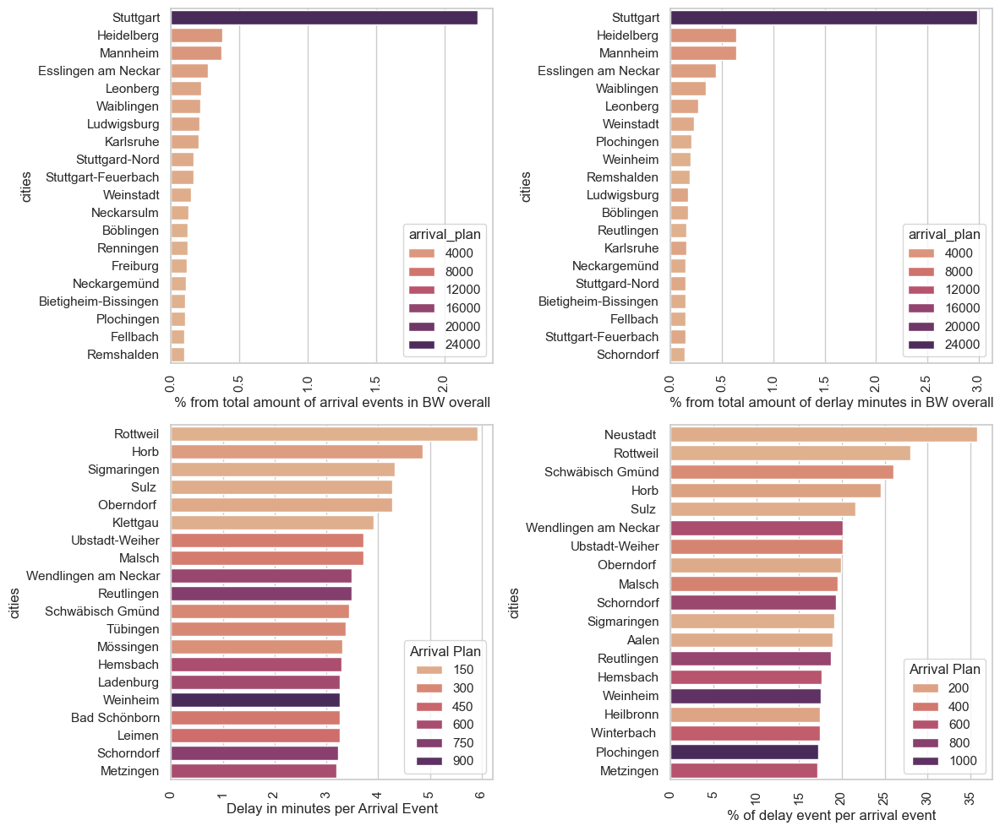

In [167]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_bw.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in BW overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_bw.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in BW overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_bw.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_bw.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 3) Bayern

In [168]:
df_bay.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
2,Nürnberg,Bayern,3400845325,2125,38451875,4748.979750,21000.669500,369,533,425,...,5.0,4.0,0.038922,0.022211,0.868235,1.176471,0.034824,0.030816,1.254118,0.941176
13,Aichach,Bayern,1672094468,1045,18089159,2324.648689,10128.373453,83,79,156,...,3.0,3.0,0.014287,0.004996,0.532051,1.923077,0.017125,0.004568,0.377990,1.435407
25,Althegnenberg,Bayern,1712116630,1070,17607492,2367.482642,10322.584036,151,151,214,...,10.0,10.0,0.019598,0.009089,0.705607,4.672897,0.017535,0.008730,0.705607,4.672897
27,Amberg,Bayern,1544109238,965,17799232,2289.540086,9543.389888,93,140,189,...,5.0,5.0,0.017309,0.005598,0.492063,2.645503,0.015814,0.008094,0.725389,2.590674
28,Ampfing,Bayern,1328095616,830,14033474,2060.212554,8010.155534,444,478,166,...,21.0,23.0,0.015202,0.026725,2.674699,12.650602,0.013602,0.027637,2.879518,13.855422


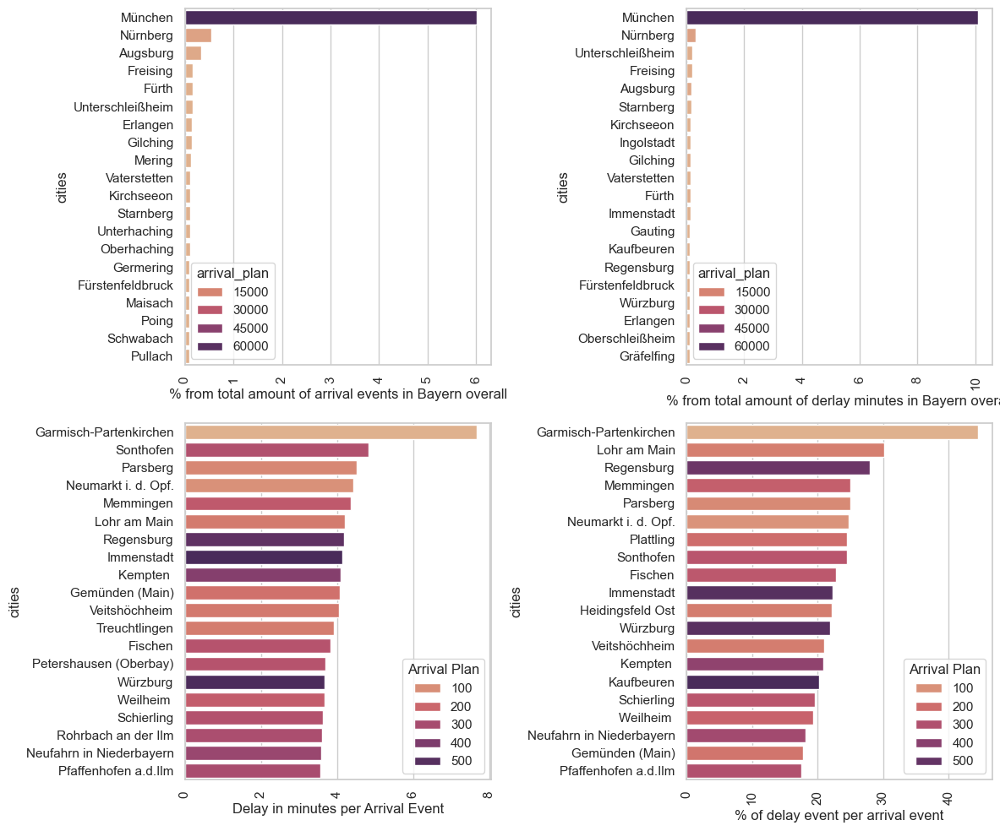

In [169]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_bay.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in Bayern overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_bay.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in Bayern overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_bay.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_bay.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

## 4) Hessen

In [170]:
df_hes.head()

,city,state,eva_nr,category,zip,long,lat,arrival_delay_m,departure_delay_m,arrival_plan,...,arrival_delay_check,departure_delay_check,arrival_plan%,arr_delay_amount_%,delay/arrival,delay_cnt/arrival,departure_plan%,dep_delay_amount_%,delay/departure,delay_cnt/departure
17,Alsbach-Hähnlein,Hessen,2256704436,1410,18235530,2427.079248,14026.496700,528,562,282,...,23.0,23.0,0.025826,0.031781,1.872340,8.156028,0.023107,0.032493,1.992908,8.156028
18,Alsfeld,Hessen,1392060900,870,6316896,1611.987678,8830.667388,116,98,138,...,8.0,6.0,0.012638,0.006982,0.840580,5.797101,0.014258,0.005666,0.563218,3.448276
51,Babenhausen,Hessen,5808010890,3630,47068032,6502.914132,36269.481138,1592,1437,726,...,96.0,76.0,0.066487,0.095825,2.192837,13.223140,0.059488,0.083083,1.979339,10.468320
58,Bad Camberg,Hessen,2000330500,1250,16380000,2063.759000,12574.108250,420,438,250,...,18.0,17.0,0.022895,0.025281,1.680000,7.200000,0.020485,0.025324,1.752000,6.800000
65,Bad Hersfeld,Hessen,2008005020,753,9099001,2438.761682,12768.277632,304,321,191,...,13.0,14.0,0.017492,0.018298,1.591623,6.806283,0.020567,0.018559,1.278884,5.577689


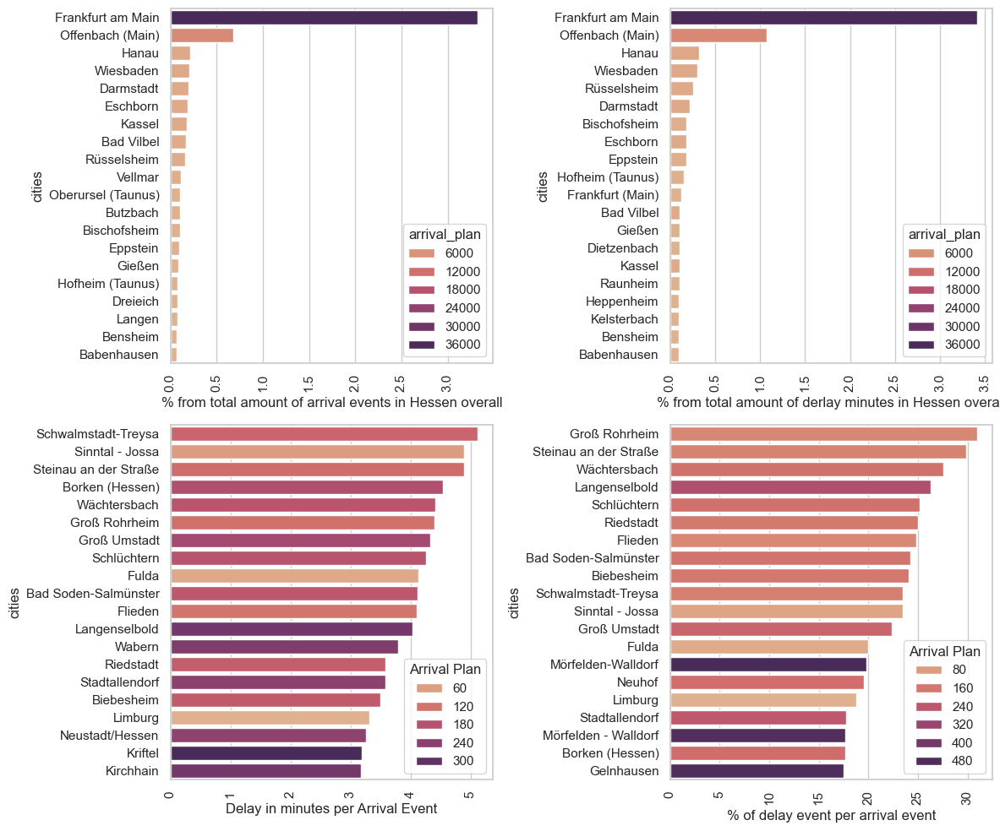

In [171]:
# Define the figure and the subplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))  # 1 row, 3 columns, each plot with a size of 8x6 inches

# Set the theme for all plots
sns.set_theme(style="whitegrid")

# First bar plot
sns.barplot(data=df_hes.sort_values(by="arrival_plan%", ascending=False).head(20), x="arrival_plan%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,0])
axes[0,0].set_xlabel("% from total amount of arrival events in Hessen overall")
axes[0,0].set_ylabel("cities")
axes[0,0].tick_params(axis='x', rotation=90)
axes[0,0].legend(title="arrival_plan")

# Second bar plot
sns.barplot(data=df_hes.sort_values(by="arr_delay_amount_%", ascending=False).head(20), x="arr_delay_amount_%", y="city", 
            palette="flare", hue="arrival_plan", orient="h", ax=axes[0,1])
axes[0,1].set_xlabel("% from total amount of derlay minutes in Hessen overall")
axes[0,1].set_ylabel("cities")
axes[0,1].tick_params(axis='x', rotation=90)
axes[0,1].legend(title="arrival_plan")

# Third bar plot
sns.barplot(data=df_hes.sort_values(by="delay/arrival", ascending=False).head(20), y="city", x="delay/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,0])
axes[1,0].set_xlabel("Delay in minutes per Arrival Event")
axes[1,0].set_ylabel("cities")
axes[1,0].tick_params(axis='x', rotation=90)
axes[1,0].legend(title="Arrival Plan")

sns.barplot(data=df_hes.sort_values(by="delay_cnt/arrival", ascending=False).head(20), y="city", x="delay_cnt/arrival", 
            palette="flare", orient="h", hue="arrival_plan", ax=axes[1,1])
axes[1,1].set_xlabel("% of delay event per arrival event")
axes[1,1].set_ylabel("cities")
axes[1,1].tick_params(axis='x', rotation=90)
axes[1,1].legend(title="Arrival Plan")

# Adjust layout
plt.tight_layout()

# Display the plots
plt.show()

# Trains

In [172]:
#clearing some variables for memory conservation
df_temp_dep = None
df_temp_arr = None
heatmap_df2 = None

In [174]:
statelist_filtered = ["Nordrhein-Westfalen", "Baden-Württemberg", "Bayern", "Hessen"]

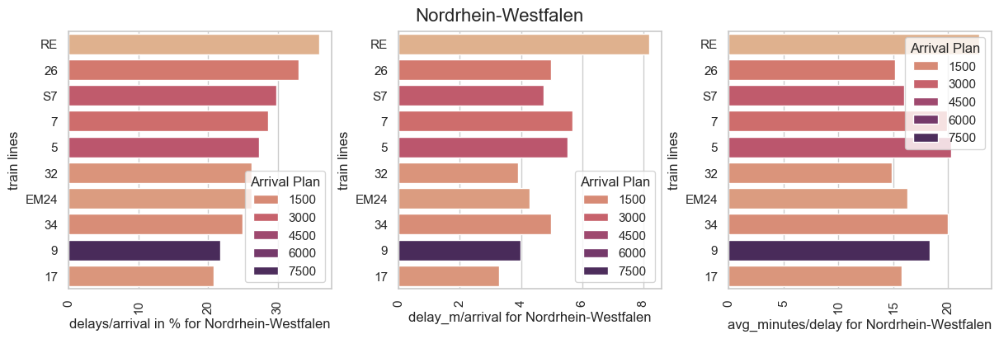

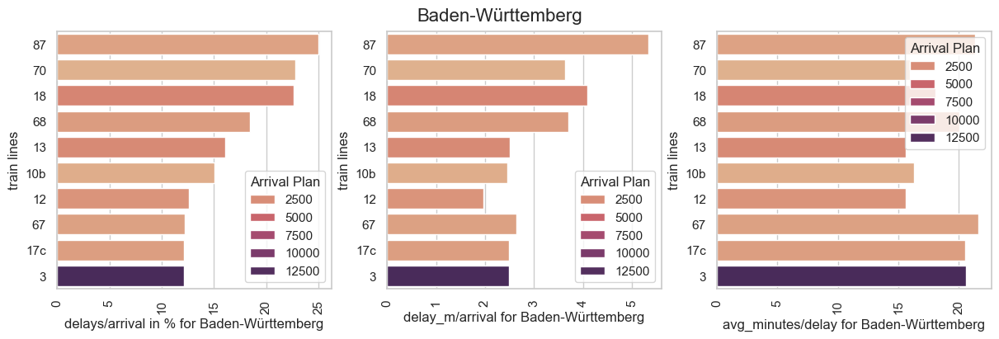

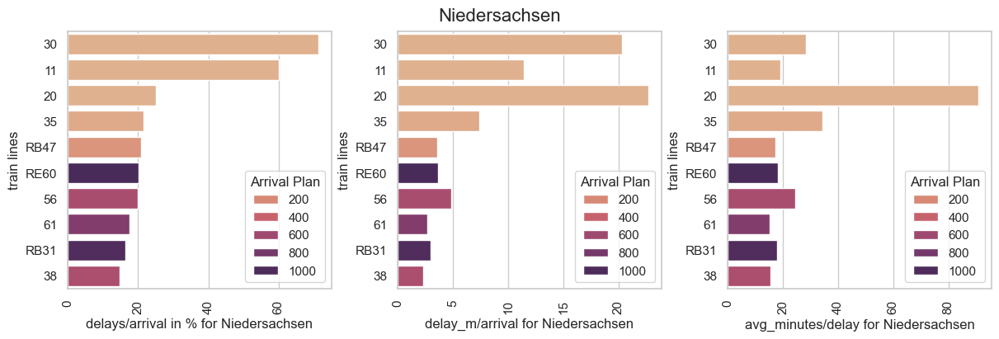

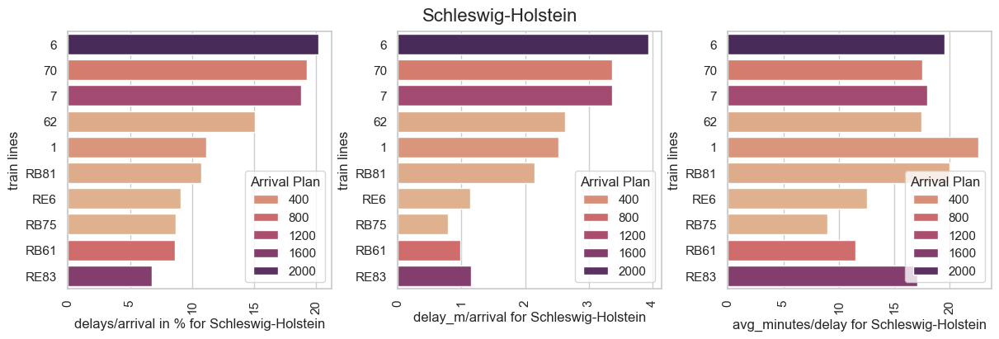

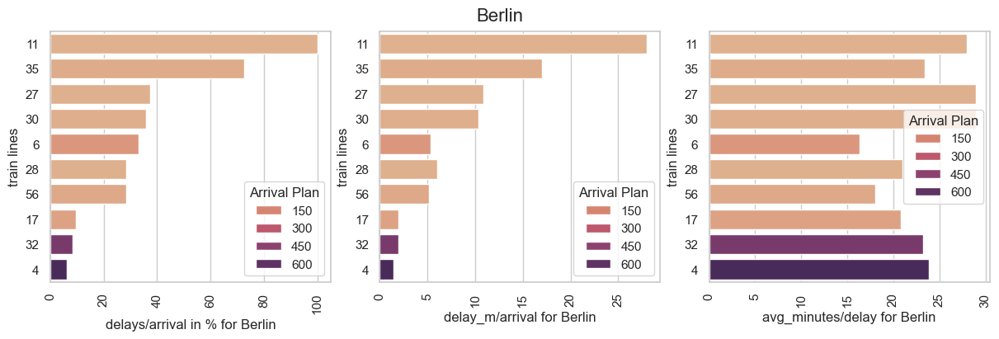

...

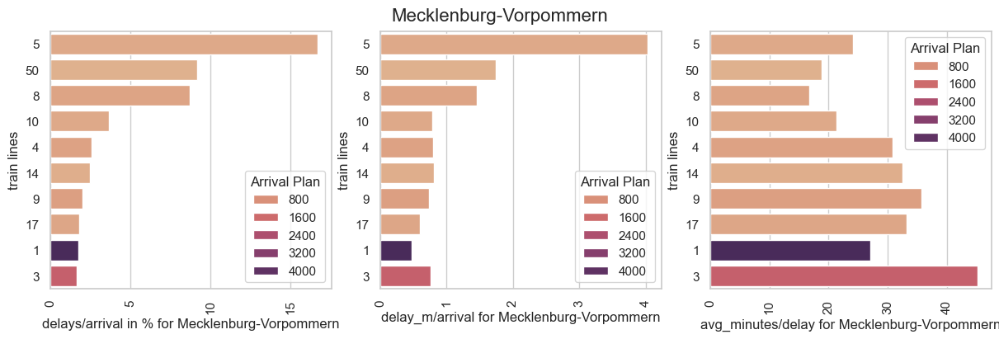

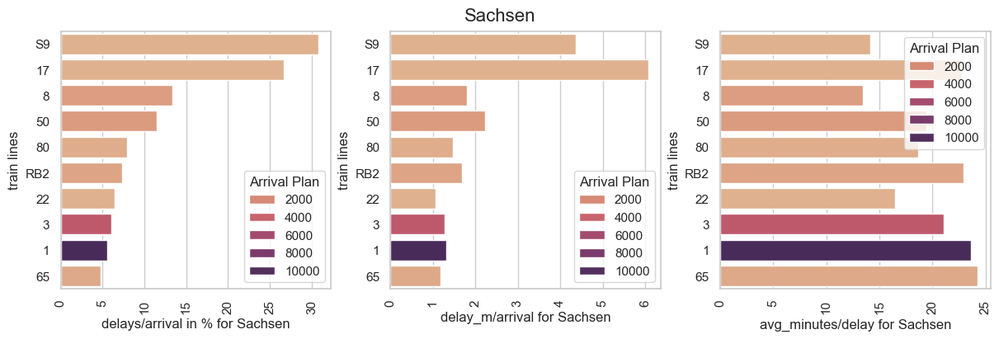

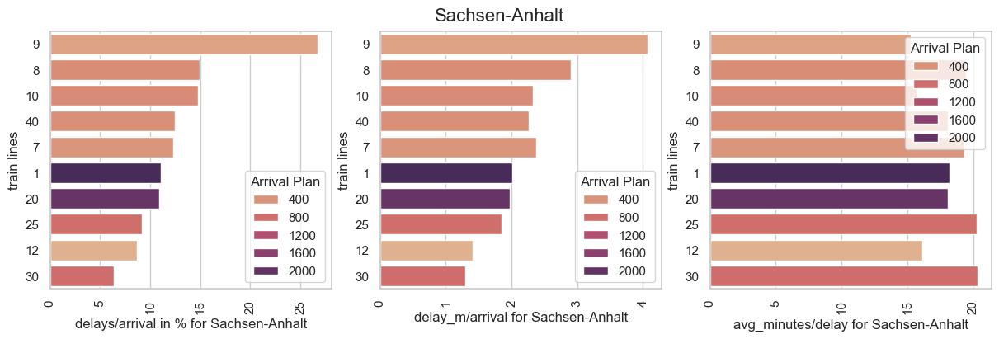

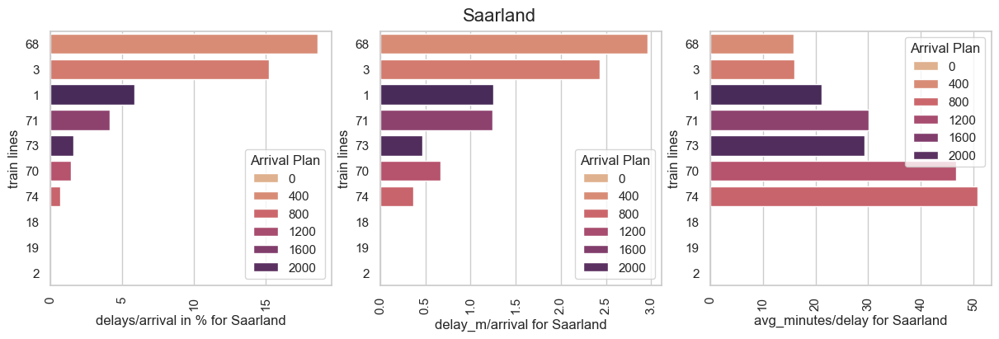

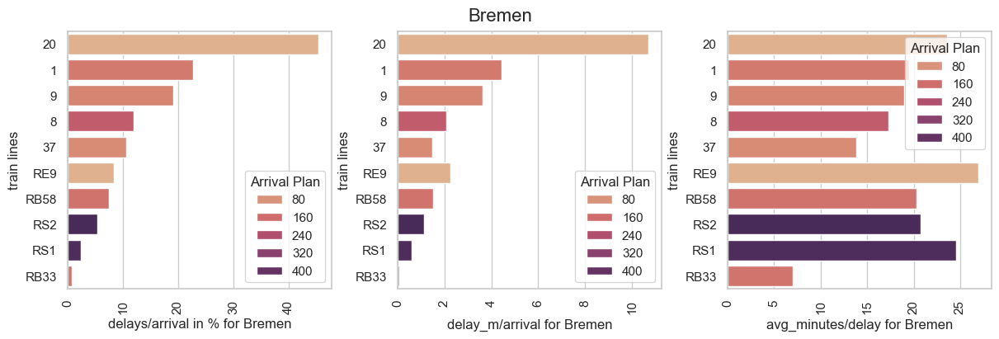

In [238]:
for state in statelist_filtered:
    df_f = df[df["state"] == state]
    df_train_sum = df_f.groupby(["train"], as_index=False).sum("arrival_delay_m")
    df_train_count = df_f.groupby(["train"], as_index=False).count()
    df_train_count_delay = df_f[df_f["arrival_delay_check"] == "delay"].groupby(["train"], as_index=False).count()

    frames[state] = pd.merge(df_train_sum, df_train_count[["train","arrival_plan","departure_plan"]], how='left', on="train", suffixes=('', '_count'))
    frames[state] = pd.merge(frames[state], df_train_count_delay[["train","arrival_delay_check"]], how='left', on="train", suffixes=('', '_count'))
    frames[state] = pd.merge(frames[state], df_train_count_delay2[["train","departure_delay_check"]], how='left', on="train", suffixes=('', '_count'))
    
    frames[state]["delay_m/arrival"] = (frames[state]["arrival_delay_m"] / frames[state]["arrival_plan"])
    frames[state]["delay_m/delay_cnt"] = (frames[state]["arrival_delay_m"] / frames[state]["arrival_delay_check"])
    frames[state]["delay_cnt/arrival"] = (frames[state]["arrival_delay_check"] / frames[state]["arrival_plan"]) *100


    
    fig, axes = plt.subplots(1, 3, figsize=(12, 4), constrained_layout=True)

    sns.barplot(data=frames[state].sort_values(by="delay_cnt/arrival", ascending=False).head(10), y="train", x="delay_cnt/arrival", 
                palette="flare", orient="h", hue="arrival_plan", ax=axes[0])
    axes[0].set_xlabel(f"delays/arrival in % for {state}")
    axes[0].set_ylabel("train lines")
    axes[0].tick_params(axis='x', rotation=90)
    axes[0].legend(title="Arrival Plan")

    sns.set_theme(style="whitegrid")
    sns.barplot(data=frames[state].sort_values(by="delay_cnt/arrival", ascending=False).head(10), y="train", x="delay_m/arrival", 
                palette="flare", orient="h", hue="arrival_plan", ax=axes[1])
    axes[1].set_xlabel(f"delay_m/arrival for {state}")
    axes[1].set_ylabel("train lines")
    axes[1].tick_params(axis='x', rotation=90)
    axes[1].legend(title="Arrival Plan")

    sns.barplot(data=frames[state].sort_values(by="delay_cnt/arrival", ascending=False).head(10), y="train", x="delay_m/delay_cnt", 
                palette="flare", orient="h", hue="arrival_plan", ax=axes[2])
    axes[2].set_xlabel(f"avg_minutes/delay for {state}")
    axes[2].set_ylabel("train lines")
    axes[2].tick_params(axis='x', rotation=90)
    axes[2].legend(title="Arrival Plan")



    fig.suptitle(state, fontsize=16)
    plt.show()
